<a href="https://colab.research.google.com/github/brunompacheco/computer-vision/blob/main/exercises/01-bmp-simple-thresholding.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!unzip ./Imagens.zip

Archive:  ./Imagens.zip
  inflating: shot0003.png            
  inflating: shot0004.png            
  inflating: shot0005.png            
  inflating: shot0006.png            
  inflating: shot0007.png            
  inflating: shot0008.png            
  inflating: shot0009.png            
  inflating: shot0010.png            
  inflating: shot0011.png            
  inflating: shot0012.png            
  inflating: shot0013.png            
  inflating: shot0014.png            
  inflating: shot0015.png            


In [ ]:
%matplotlib inline

import cv2
import numpy as np

from matplotlib import pyplot as plt
from pathlib import Path

# Data

In [ ]:
images_fpaths = list(Path('/content').glob('*.png'))
images_fpaths = [str(f) for f in images_fpaths]
len(images_fpaths)

13

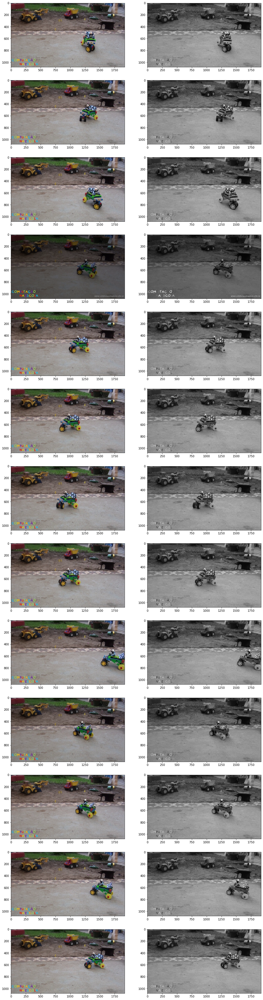

In [ ]:
fig, axes = plt.subplots(len(images_fpaths), 2, figsize=(16, len(images_fpaths)*5))
axs = axes.ravel()

images = list()
gray_images = list()
for i, image_fpath in enumerate(images_fpaths):
    # Load the image in color (OpenCV standard = BGR)
    image = cv2.imread(image_fpath, cv2.IMREAD_COLOR)
    # Convert to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    gray_image = cv2.imread(image_fpath, cv2.IMREAD_GRAYSCALE)

    axs[2*i].imshow(image)
    axs[2*i + 1].imshow(gray_image, 'gray')

    images.append(image)
    gray_images.append(gray_image)

gray_images = np.stack(gray_images)
images = np.stack(images)

fig.show()

# Creation of reference image

Through the median value of the grayscale images, I get the reference image through the most common pixels.

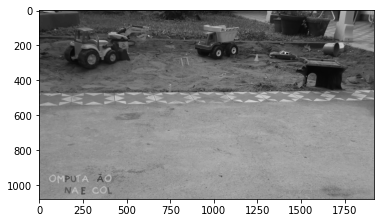

In [ ]:
# manual adjustment of the "median"
i_median = 8
ref_gray = np.sort(gray_images, axis=0)[i_median]
plt.imshow(ref_gray, 'gray')
plt.show()

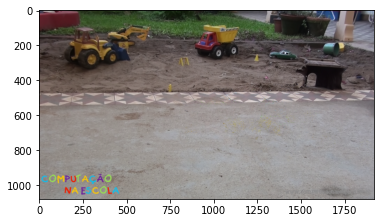

In [ ]:
median_arg = np.argsort(gray_images, axis=0)

ref = np.take_along_axis(images, np.stack([median_arg,]*3, axis=-1), axis=0)[i_median]

plt.imshow(ref)
plt.show()

# Histogram Mathching

The goal is to have some kind of automatic normalization.

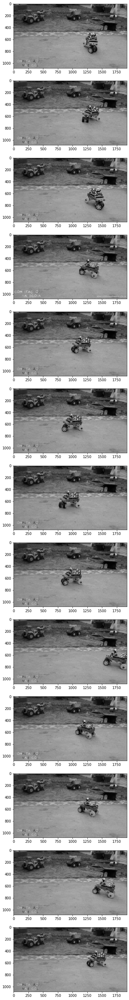

In [ ]:
from skimage.exposure import match_histograms

gray_fixeds = [match_histograms(gray_image, ref_gray).astype('uint8') for gray_image in gray_images]
gray_fixeds = np.stack(gray_fixeds)

fig, axes = plt.subplots(13, 1, figsize=(8, 13*4))
for ax, gray_fixed in zip(axes.ravel(), gray_fixeds):
    ax.imshow(gray_fixed, 'gray')
fig.show()

# Simple Threshold

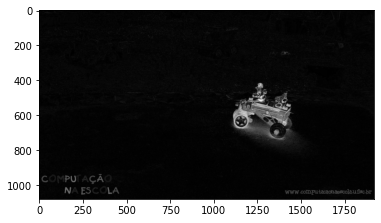

In [ ]:
changes = [cv2.absdiff(gray, ref_gray) for gray in gray_fixeds]

plt.imshow(changes[3], 'gray')
plt.show()

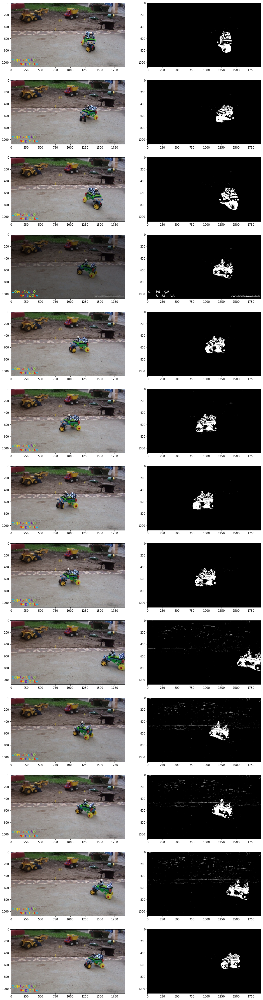

In [ ]:
modes = ['cv2.THRESH_BINARY',
         'cv2.THRESH_BINARY_INV',
         'cv2.THRESH_TRUNC',
         'cv2.THRESH_TOZERO',
         'cv2.THRESH_TOZERO_INV']

# Basic threshold example
dsts = list()
def my_threshold(thresh, modeStr):
    global change
    global dst
    mode = eval(modeStr)

    fig, axes = plt.subplots(len(images_fpaths), 2, figsize=(16, len(images_fpaths)*5))
    axs = axes.ravel()
    for i, image in enumerate(images):
        axs[2*i].imshow(image)

        th, dst = cv2.threshold(changes[i], thresh, 255, mode)
        axs[2*i + 1].imshow(dst, 'gray')
        dsts.append(dst)

my_threshold(50, 'cv2.THRESH_BINARY')

# Dilation and Erosion

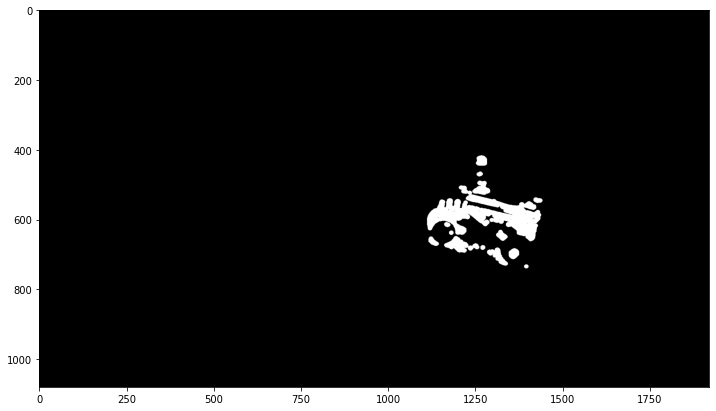

In [ ]:
k = 13 
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(k,k))

openings = [cv2.morphologyEx(dst, cv2.MORPH_OPEN, kernel) for dst in dsts]

# Set the size to show
plt.figure(figsize = (12,10))
plt.imshow(openings[3], 'gray') 

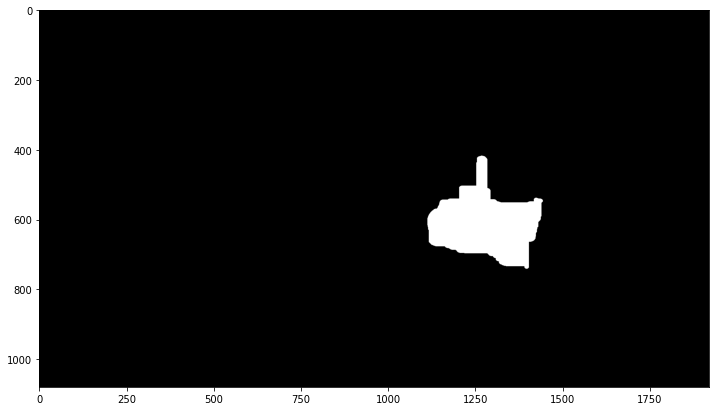

In [ ]:
k = 70
kernel2 = np.ones((k,k),np.uint8)

closings = [cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel2) for opening in openings]

plt.figure(figsize = (12,10))
plt.imshow(closings[3], 'gray') 

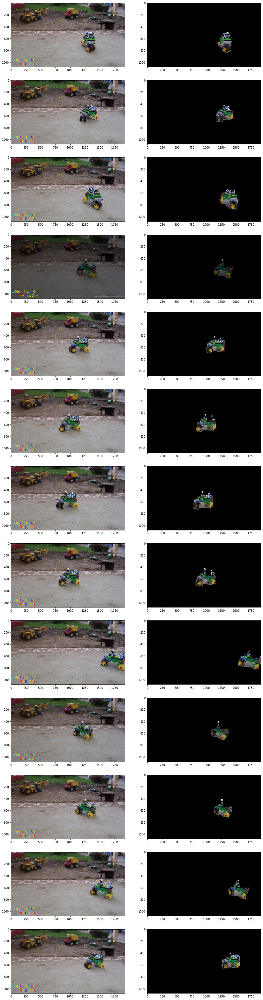

In [ ]:
maskeds = [cv2.bitwise_and(image, image, mask=(closing//255))
           for image,closing in zip(images, closings)]

fig, axes = plt.subplots(len(images), 2, figsize=(16, len(images)*5))
axs = axes.ravel()
for i, image in enumerate(images):
    axs[2*i].imshow(image)
    axs[2*i + 1].imshow(maskeds[i])
fig.show()